In [1]:

%matplotlib inline
import numpy as np # type: ignore
import pandas as pd
import matplotlib.pyplot as plt
import time,os,glob
import seaborn as sns
import cv2
import tensorflow as tf
from tensorflow.python.keras import backend as K
import tensorflow as tf
from tensorflow.python.keras import utils as ttt
import keras
from keras import layers


Fonctions :

In [3]:
#Data normalization
def my_preprocessing_func(img):
    image = np.array(img)
    return image / 255

def segment_plant(image):
    ''' Attempts to segment the plant out of the provided image '''
    # Convert the image into HSV
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    # Set the orange range
    clights_green = (36, 25, 25)
    cdarks_green = (130,255, 255)

    # Apply the orange mask 
    mask = cv2.inRange(hsv_image, clights_green, cdarks_green) # type: ignore
  
    result = cv2.bitwise_and(image, image, mask=mask)

    # Clean up the segmentation using a blur
    blur = cv2.GaussianBlur(result, (7, 7), 0)
    return blur


ImageDataGenerator & 1er Visualisation

In [4]:
print('getcwd: ', os.getcwd())
directory1=(r"D:\Adrien et Sarah\Téléchargements\DATASETS\Maladie_sur_les_plantes\01_New_Plant_Diseases_Dataset\train")
directory2=(r"D:\Adrien et Sarah\Téléchargements\DATASETS\Maladie_sur_les_plantes\01_New_Plant_Diseases_Dataset\valid")

print('le filename de img_color est :', directory1)

train_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=my_preprocessing_func)
val_gen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=my_preprocessing_func)   

train_generator=train_gen.flow_from_directory(
    directory=directory1,
    target_size=(128, 128),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
)

valid_generator = val_gen.flow_from_directory(
    directory=directory2,
    target_size=(128, 128),
    color_mode="rgb",
    batch_size=32,
    class_mode="categorical",
    shuffle=True,
    seed=42
)


getcwd:  d:\Adrien et Sarah\Documents\GitHub\JAN24_PLANT_RECOGNITION\notebooks
le filename de img_color est : D:\Adrien et Sarah\Téléchargements\DATASETS\Maladie_sur_les_plantes\01_New_Plant_Diseases_Dataset\train
Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


{'Apple___Apple_scab': 0, 'Apple___Black_rot': 1, 'Apple___Cedar_apple_rust': 2, 'Apple___healthy': 3, 'Blueberry___healthy': 4, 'Cherry_(including_sour)___Powdery_mildew': 5, 'Cherry_(including_sour)___healthy': 6, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7, 'Corn_(maize)___Common_rust_': 8, 'Corn_(maize)___Northern_Leaf_Blight': 9, 'Corn_(maize)___healthy': 10, 'Grape___Black_rot': 11, 'Grape___Esca_(Black_Measles)': 12, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13, 'Grape___healthy': 14, 'Orange___Haunglongbing_(Citrus_greening)': 15, 'Peach___Bacterial_spot': 16, 'Peach___healthy': 17, 'Pepper,_bell___Bacterial_spot': 18, 'Pepper,_bell___healthy': 19, 'Potato___Early_blight': 20, 'Potato___Late_blight': 21, 'Potato___healthy': 22, 'Raspberry___healthy': 23, 'Soybean___healthy': 24, 'Squash___Powdery_mildew': 25, 'Strawberry___Leaf_scorch': 26, 'Strawberry___healthy': 27, 'Tomato___Bacterial_spot': 28, 'Tomato___Early_blight': 29, 'Tomato___Late_blight': 30, 'Tomato

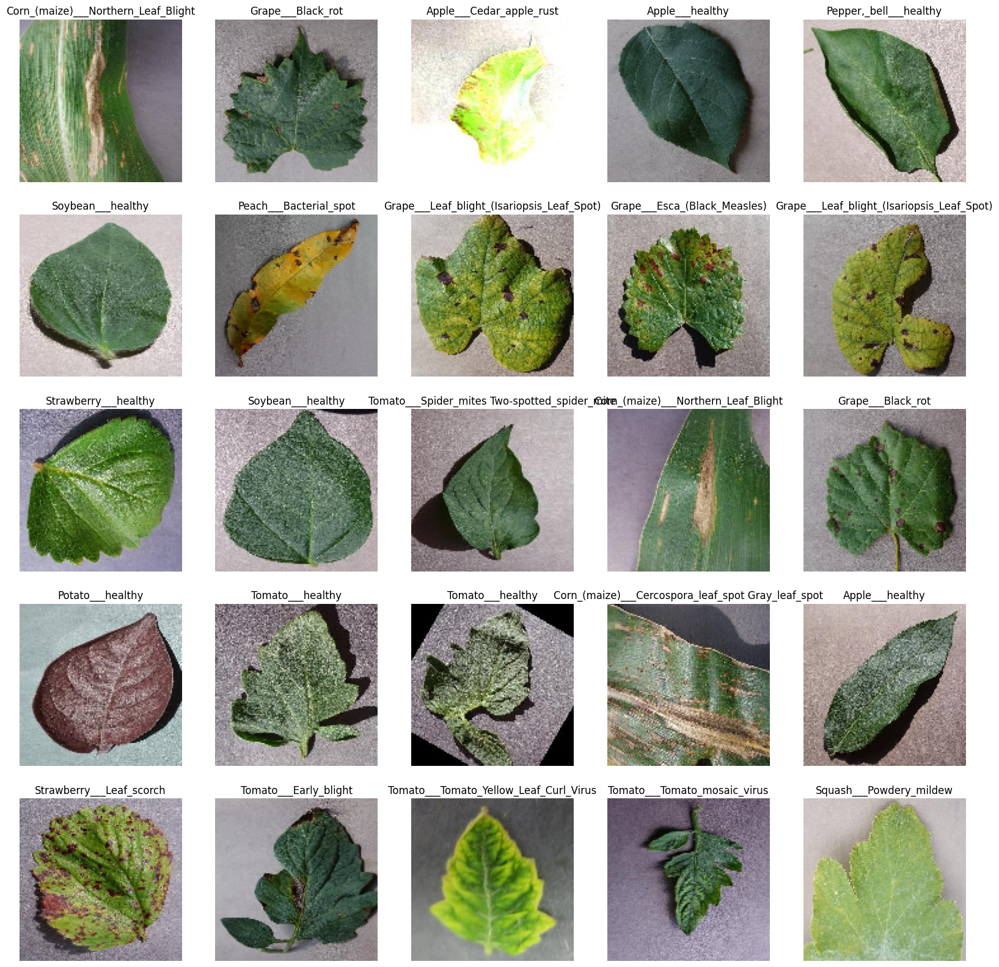

In [5]:
labels = (train_generator.class_indices)
print(labels)
labels = dict((v,k) for k,v in labels.items())

#pd.DataFrame(labels.values()).to_csv("labels.csv")

x_train, y_train = next(train_generator)
y_train = [labels[k] for k in y_train.argmax(axis=1)]

fig, axes = plt.subplots(5,5, figsize = (20,20))
axes = axes.ravel()
for i in range (0,5*5):
    image = x_train[i] 
    axes[i].imshow(image)
    axes[i].set_title(y_train[i])
    axes[i].axis('off')
    
plt.subplots_adjust(hspace=0.2)

In [6]:
list_of_labels = os.listdir(directory1)
countclass=[]
for label in list_of_labels:
    current_label_dir_path = os.path.join(directory1, label)
    list_of_images = os.listdir(current_label_dir_path)
    countclass.append(len(list_of_images))    
 
distributiontrainingset=pd.DataFrame({"classe" : list_of_labels,"nbre_image":countclass}) 
       
list_of_labels = os.listdir(directory2)
countclass=[]
for label in list_of_labels:
    current_label_dir_path = os.path.join(directory2, label)
    list_of_images = os.listdir(current_label_dir_path)
    countclass.append(len(list_of_images))    
 
distributionvalidset=pd.DataFrame({"classe" : list_of_labels,"nbre_image":countclass})       
list_of_labels = os.listdir(directory1)
t=[]
h=[]
w=[]
c=[]
c1=[]
c2=[]
c3=[]
cheminimg=[]
for label in list_of_labels:
    current_label_dir_path = os.path.join(directory1, label)
    list_of_images = os.listdir(current_label_dir_path)
    os.chdir(current_label_dir_path)
    for imag in glob.glob("*.jpg"):
        #print(os.path.join(current_label_dir_path,imag))
        im=cv2.cvtColor(cv2.imread(imag),cv2.COLOR_BGR2RGB)
        im=segment_plant(im)
        c1.append(im[:,:,0].mean())
        c2.append(im[:,:,1].mean())
        c3.append(im[:,:,2].mean())
        h.append(im.shape[0])
        w.append(im.shape[1])
        c.append(im.shape[2])
        t.append(os.path.getsize(imag))
        cheminimg.append(os.path.join(current_label_dir_path,imag))
list_of_labels = os.listdir(directory2)   
for label in list_of_labels:
    current_label_dir_path = os.path.join(directory2, label)
    list_of_images = os.listdir(current_label_dir_path)
    os.chdir(current_label_dir_path)
    for imag in glob.glob("*.jpg"):
        #print(os.path.join(current_label_dir_path,imag))
        im=cv2.cvtColor(cv2.imread(imag),cv2.COLOR_BGR2RGB)
        im=segment_plant(im)
        c1.append(im[:,:,0].mean())
        c2.append(im[:,:,1].mean())
        c3.append(im[:,:,2].mean())
        h.append(im.shape[0])
        w.append(im.shape[1])
        c.append(im.shape[2])
        t.append(os.path.getsize(imag))
        cheminimg.append(os.path.join(current_label_dir_path,imag))
        
analysedataset=pd.DataFrame({"taille" : t,"height":h,"Width":w,"couleur":c,"file_path":cheminimg,"canalR":c1,"canalG":c2,"canalB":c3})  
h.clear()  
h.clear() 
h.clear()
w.clear()
c.clear()
t.clear()
c1.clear()
c2.clear()
c3.clear()
list_of_labels.clear()
list_of_images.clear()
cheminimg.clear()
analysedataset.to_csv('features.csv')


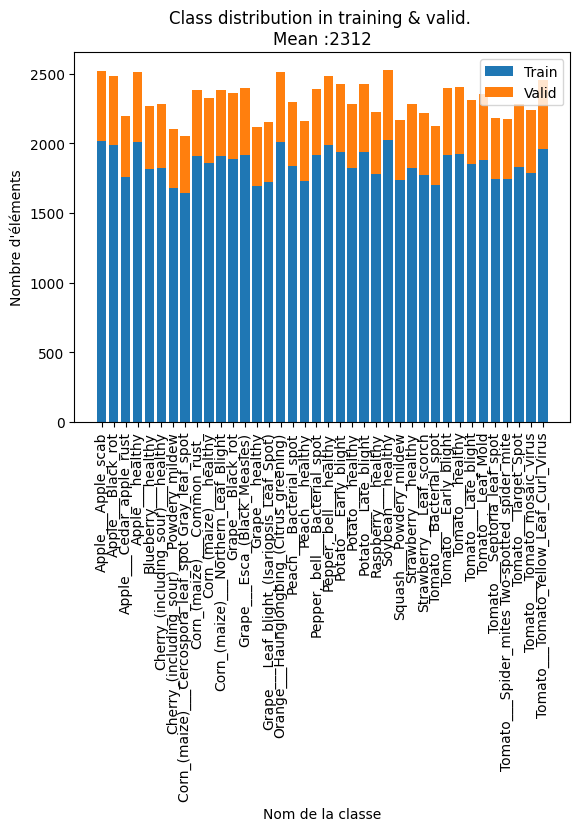

Le DATASET est equilibré


In [7]:

plt.bar(distributiontrainingset.classe,distributiontrainingset.nbre_image,label="Train")
plt.bar(distributionvalidset.classe,distributionvalidset.nbre_image,label="Valid",bottom=distributiontrainingset.nbre_image)
(distributionvalidset.nbre_image+distributiontrainingset.nbre_image).mean()
plt.title('Class distribution in training & valid. \nMean :'+str(int((distributionvalidset.nbre_image+distributiontrainingset.nbre_image).mean())))
plt.xticks(rotation='vertical')
plt.xlabel("Nom de la classe")
plt.ylabel("Nombre d'éléments")
plt.legend()
plt.show()
print("Le DATASET est equilibré")

Visualisation de la taille

In [8]:
print(f"Ensemble des height:{analysedataset.height.value_counts()},Ensemble des Width:{analysedataset.Width.value_counts()}")
print("Les tailles hauteurs largeurs des images sont identiques 256 x 256")


Ensemble des height:height
256    87867
Name: count, dtype: int64,Ensemble des Width:Width
256    87867
Name: count, dtype: int64
Les tailles hauteurs largeurs des images sont identiques 256 x 256


nous avons une tendance plus elever sur le vert ce qui est coherent pour des plantes


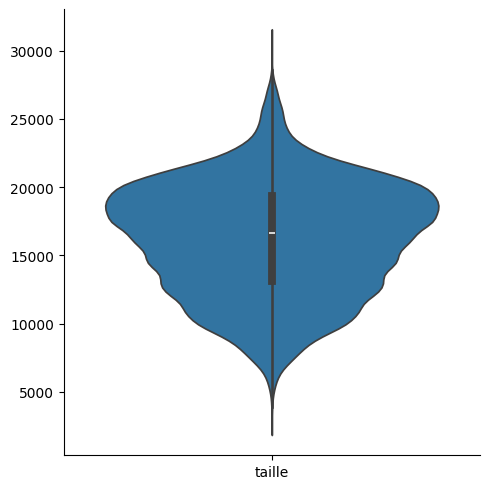

In [9]:
sns.catplot([analysedataset.taille],kind="violin");
print("nous avons une tendance plus elever sur le vert ce qui est coherent pour des plantes")

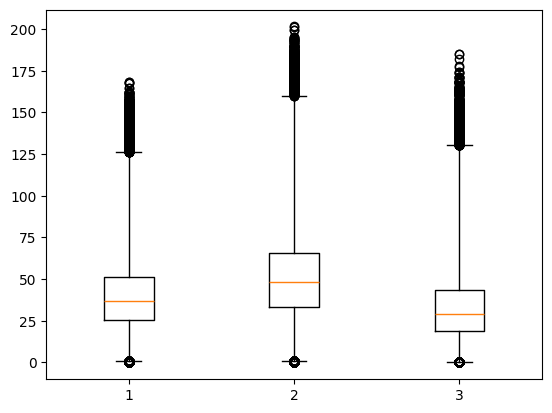

In [10]:
plt.boxplot([analysedataset.canalR,analysedataset.canalG,analysedataset.canalB],whis=(1,99));


In [11]:
quantile_dn=analysedataset.taille.quantile(0.001)
quantile_up=analysedataset.taille.quantile(0.999)
imgdn=analysedataset.loc[analysedataset["taille"]<quantile_dn]
imgup=analysedataset.loc[analysedataset["taille"]>quantile_up]
print("Nombres images 1er quantile",len(imgdn))
print("Nombres images 4er quantile",len(imgup))

Nombres images 1er quantile 88
Nombres images 4er quantile 88


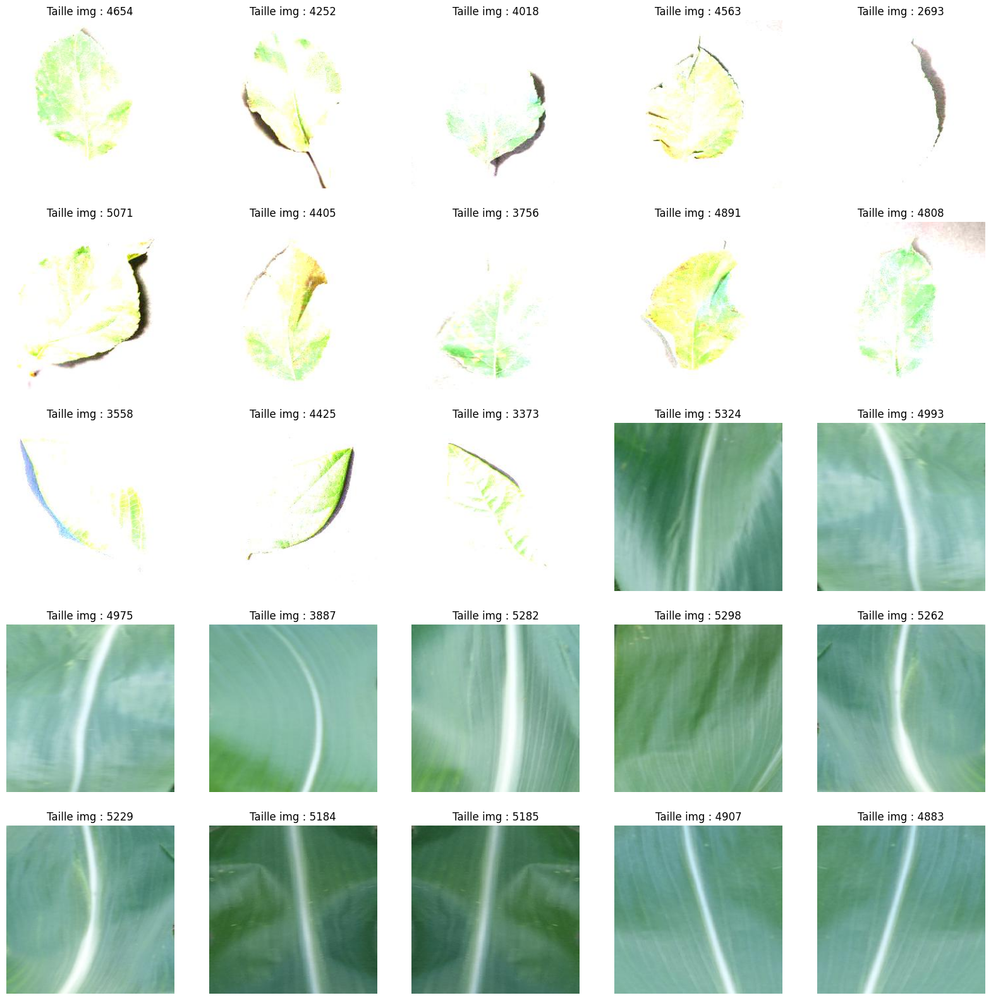

In [15]:
fig, axes = plt.subplots(5,5, figsize = (20,20))
axes = axes.ravel()
for i in range (0,5*5):
    image = plt.imread(imgdn.file_path.iloc[i])
    axes[i].imshow(image)
    axes[i].set_title(f"Taille img : {imgdn.taille.iloc[i]}")
    axes[i].axis('off')
    
plt.subplots_adjust(hspace=0.2)

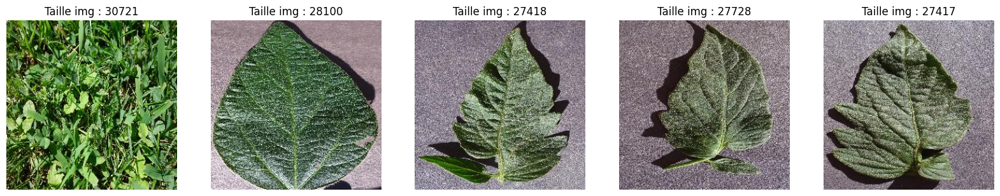

In [17]:
fig, axes = plt.subplots(1,5, figsize = (20,20))
axes = axes.ravel()
for i in range (0,1*5):
    image = plt.imread(imgup.file_path.iloc[i])
    axes[i].imshow(image)
    axes[i].set_title(f"Taille img : {imgup.taille.iloc[i]}")
    axes[i].axis('off')
    
plt.subplots_adjust(hspace=0.2)

In [19]:
quantile_dn=analysedataset.canalR.quantile(0.002)
quantile_up=analysedataset.canalG.quantile(0.995)
imgdn=analysedataset.loc[analysedataset["canalR"]<=0]
imgup=analysedataset.loc[analysedataset["canalG"]>quantile_up]
print("Nombres images 1er quantile",len(imgdn))
print("Nombres images 4er quantile",len(imgup))

Nombres images 1er quantile 80
Nombres images 4er quantile 440


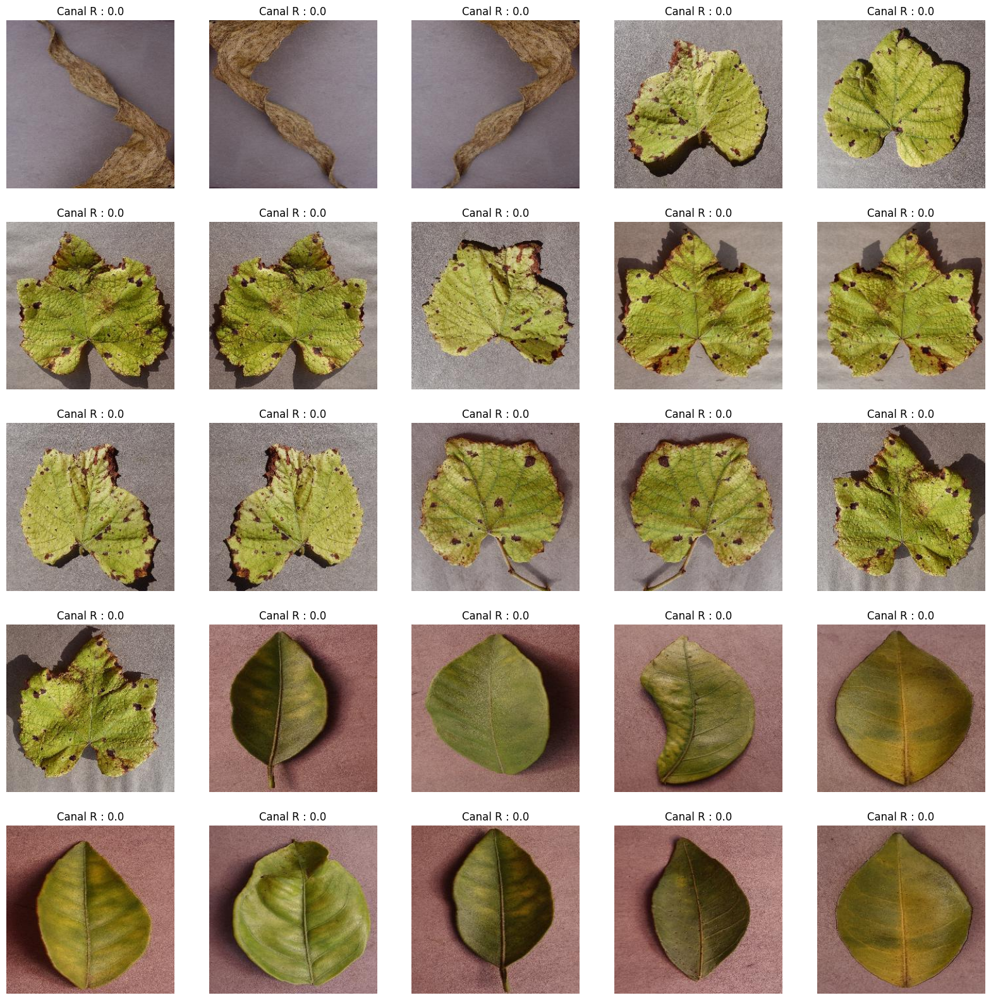

In [20]:
fig, axes = plt.subplots(5,5, figsize = (20,20))
axes = axes.ravel()
for i in range (0,5*5):
    image = plt.imread(imgdn.file_path.iloc[i])
    axes[i].imshow(image)
    axes[i].set_title(f"Canal R : {imgdn.canalR.iloc[i]}")
    axes[i].axis('off')
    
plt.subplots_adjust(hspace=0.2)

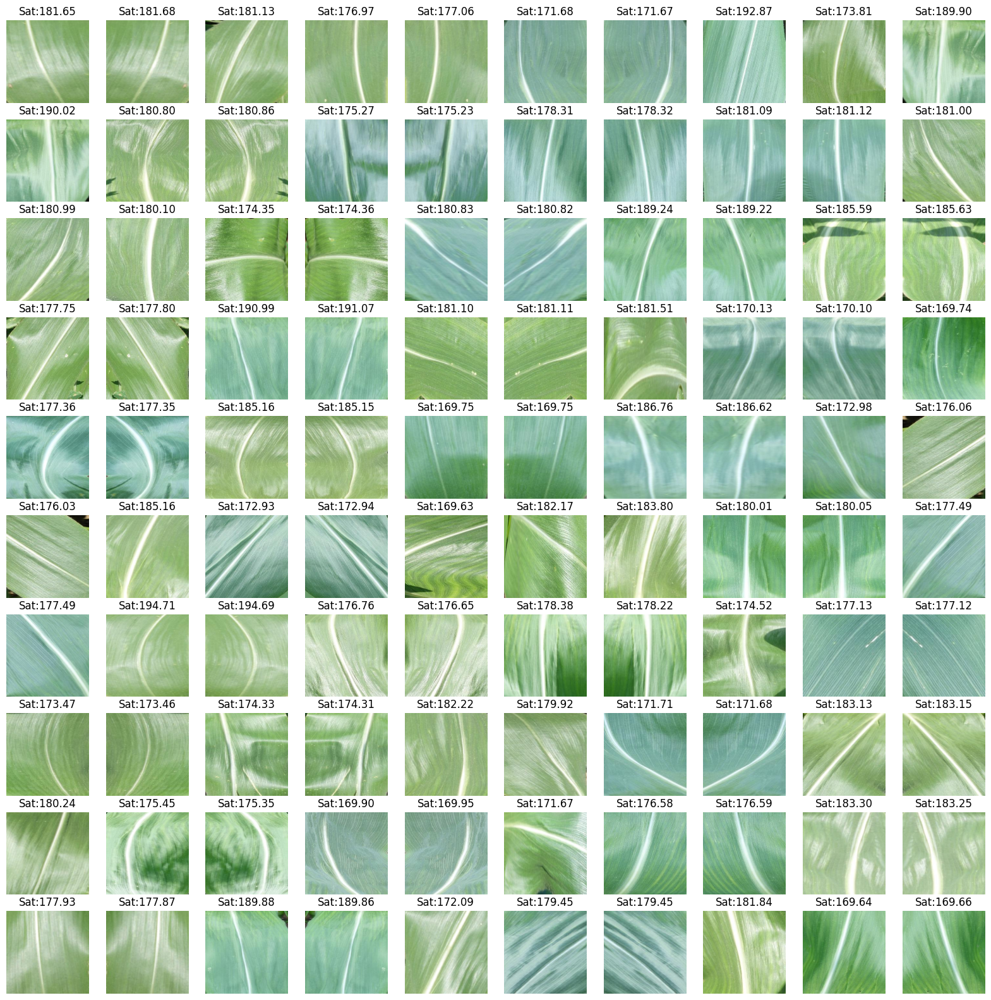

In [21]:
fig, axes = plt.subplots(10,10, figsize = (20,20))
axes = axes.ravel()
for i in range (0,10*10):
    image = plt.imread(imgup.file_path.iloc[i])
    #image=segment_plant(image)
    axes[i].imshow(image)
    axes[i].set_title(f"Sat:{imgup.canalG.iloc[i]:.2f}")
    axes[i].axis('off')
    
plt.subplots_adjust(hspace=0.2)

DataFrame avec une colonne "file_path" contenant les chemins des fichiers à supprimer

In [5]:

# Fonction pour supprimer les fichiers listés dans le DataFrame
def supprimer_fichiers(df):
    for index, row in df.iterrows():
        file_path = row['file_path']
        try:
            if os.path.exists(file_path):
                os.remove(file_path)
                print(f"Fichier supprimé : {file_path}")
            else:
                print(f"Le fichier n'existe pas : {file_path}")
        except Exception as e:
            print(f"Erreur lors de la suppression de {file_path} : {e}")



In [38]:
frame1=analysedataset.loc[analysedataset["taille"]<analysedataset.taille.quantile(0.001)]["file_path"]
frame2=analysedataset.loc[analysedataset["taille"]>30000]["file_path"]
frame3=analysedataset.loc[analysedataset["canalG"]>analysedataset.canalG.quantile(0.998)]["file_path"]
print ("Nombre d'images avec une taille réduite:",len(frame1),"\nNombre d'images avec une taille supérieure à 30KO:",len(frame2),".\nNombre d'images avec le canal vert Supérieur à une quantile:",len(frame3))
result=pd.concat([frame1,frame2,frame3])
os.chdir(r"D:\Adrien et Sarah\Documents\GitHub\JAN24_PLANT_RECOGNITION\notebooks")
#result.to_csv("Outliers_AP.csv",index=False)
print('getcwd: ', os.getcwd())

Nombre d'images avec une taille réduite: 88 
Nombre d'images avec une taille supérieure à 30KO: 1 .
Nombre d'images avec le canal vert Supérieur à une quantile: 176
getcwd:  D:\Adrien et Sarah\Documents\GitHub\JAN24_PLANT_RECOGNITION\notebooks


In [6]:
os.chdir(r"D:\Adrien et Sarah\Documents\GitHub\JAN24_PLANT_RECOGNITION\references")
df=pd.read_csv("Outliers_AP.csv",sep=";")
os.chdir(r"D:\Adrien et Sarah\Documents\GitHub\models\DATASETS\Maladie_sur_les_plantes\03_Plant_Diseases_Dataset_off_outliers")
supprimer_fichiers(df)

Fichier supprimé : train\Apple___Cedar_apple_rust\0a41c25a-f9a6-4c34-8e5c-7f89a6ac4c40___FREC_C.Rust 9807_newPixel25.JPG
Fichier supprimé : train\Apple___Cedar_apple_rust\20ef08f2-96ae-4148-942c-3d7708cd94d8___FREC_C.Rust 9830_newPixel25.JPG
Fichier supprimé : train\Apple___Cedar_apple_rust\2af1177b-1a2f-4dbe-b7f1-93118342d44e___FREC_C.Rust 0036_newPixel25.JPG
Fichier supprimé : train\Apple___Cedar_apple_rust\6fe0e179-4491-4257-a1d3-9cff9e9e2d27___FREC_C.Rust 0225_newPixel25.JPG
Fichier supprimé : train\Apple___Cedar_apple_rust\bee59bef-1155-40bd-97a3-8c600c33e6b5___FREC_C.Rust 0082_newPixel25.JPG
Fichier supprimé : train\Apple___Cedar_apple_rust\d4cda9ab-6b06-4551-ad3d-ee61dd78450a___FREC_C.Rust 3592_newPixel25.JPG
Fichier supprimé : train\Apple___Cedar_apple_rust\d6485527-aab0-463c-b895-64d7612f45f1___FREC_C.Rust 0144_newPixel25.JPG
Fichier supprimé : train\Apple___Cedar_apple_rust\dc75b693-0cd6-4a48-b0a0-e442070df2cc___FREC_C.Rust 9951_newPixel25.JPG
Fichier supprimé : train\Apple__